In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

In [111]:
data = np.loadtxt("deriv/data1.dat", dtype="str")
data = pd.DataFrame(data)
data.columns = ["z", "p(z)", "dp/dz", "ddx1_f", "ddx1_b", "ddx2", "ddx4"]

for col in data.columns:
    for i in range(len(data)):
        data[col] = pd.to_numeric(data[col], errors="coerce")

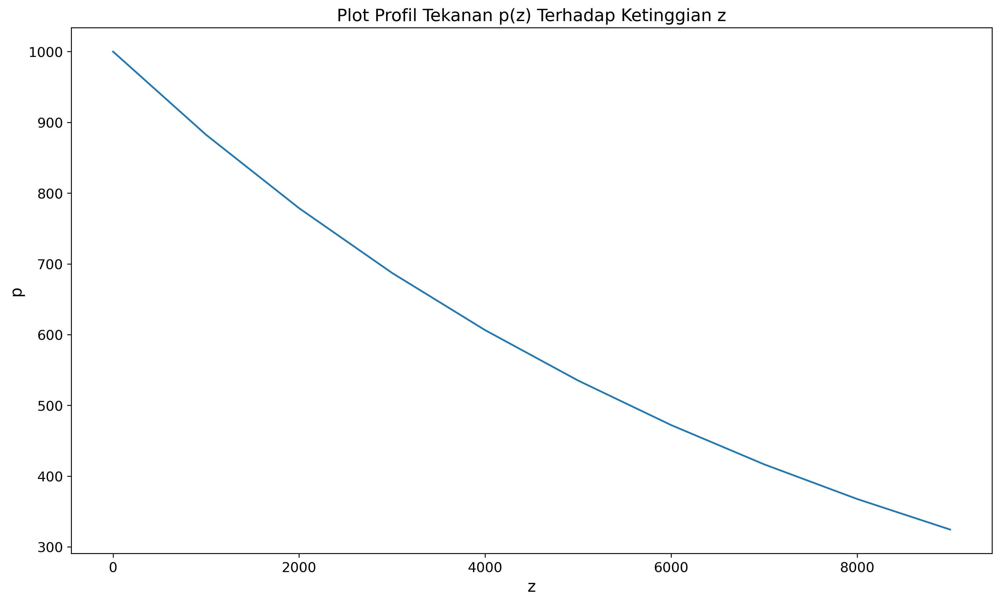

In [112]:
fig = plt.figure(figsize=(14,8), dpi=300)
ax = fig.add_axes([0.1, 0.1, 0.8, 0.8])

ax.plot(z, p)
ax.set_xlabel('z', fontsize=14)
ax.set_ylabel('p', fontsize=14)
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)
ax.set_title('Plot Profil Tekanan p(z) Terhadap Ketinggian z', fontsize=15)
fig.savefig("output/no41a.png", dpi=300)

In [118]:
# Plot dp/dz terhadap ketinggian
ddx1_f = data["ddx1_f"]
ddx1_b = data["ddx1_b"]
ddx2 = data["ddx2"]
ddx4 = data["ddx4"]
deriv = data["dp/dz"]

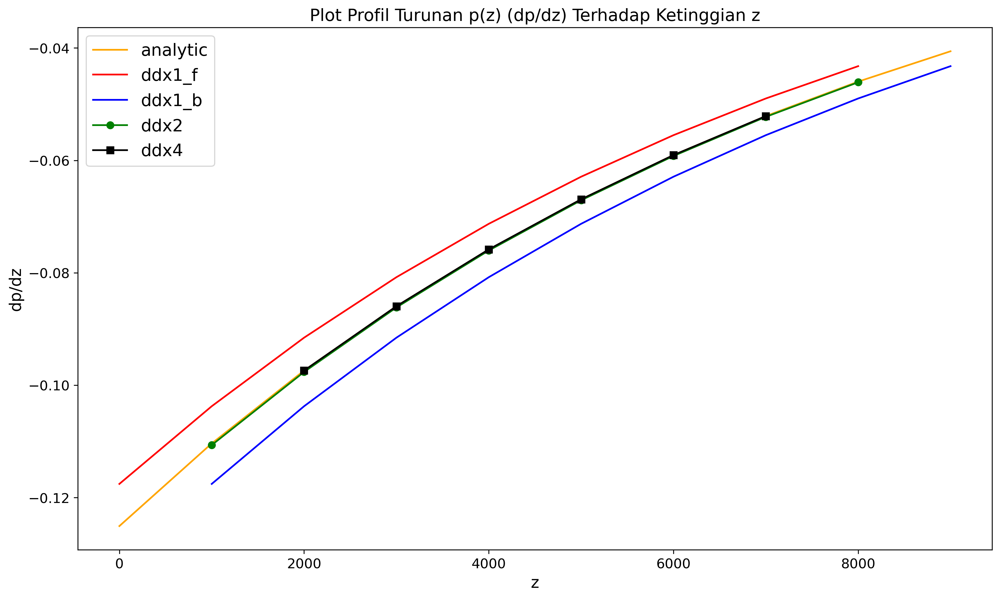

In [119]:
fig2 = plt.figure(figsize=(14,8), dpi=300)
ax2 = fig2.add_axes([0.1, 0.1, 0.8, 0.8])

ax2.plot(z, deriv, color = "orange", label = "analytic")
ax2.plot(z, ddx1_f, color = "red", label = "ddx1_f")
ax2.plot(z, ddx1_b, color = "blue", label = "ddx1_b")
ax2.plot(z, ddx2, color = "green", label = "ddx2", marker = "o")
ax2.plot(z, ddx4, color = "black", label = "ddx4", marker = "s")

ax2.set_xlabel('z', fontsize=14)
ax2.set_ylabel('dp/dz', fontsize=14)

ax2.tick_params(axis='x', labelsize=12)
ax2.tick_params(axis='y', labelsize=12)

ax2.legend(loc=2, fontsize = 15) # upper left corner

ax2.set_title('Plot Profil Turunan p(z) (dp/dz) Terhadap Ketinggian z', fontsize=15)
fig2.savefig("output/no41b_dpdz.png", dpi=300)

In [116]:
# Plot eror terhadap ketinggian
true = data["dp/dz"]
true1_f = np.zeros(10)
true1_b = np.zeros(10)
true2 = np.zeros(10)
true4 = np.zeros(10)

for i in range(10):
    true1_f[i] = abs((ddx1_f[i] - true[i])/true[i])*100
    true1_b[i] = abs((ddx1_b[i] - true[i])/true[i])*100
    true2[i] = abs((ddx2[i] - true[i])/true[i])*100
    true4[i] = abs((ddx4[i] - true[i])/true[i])*100

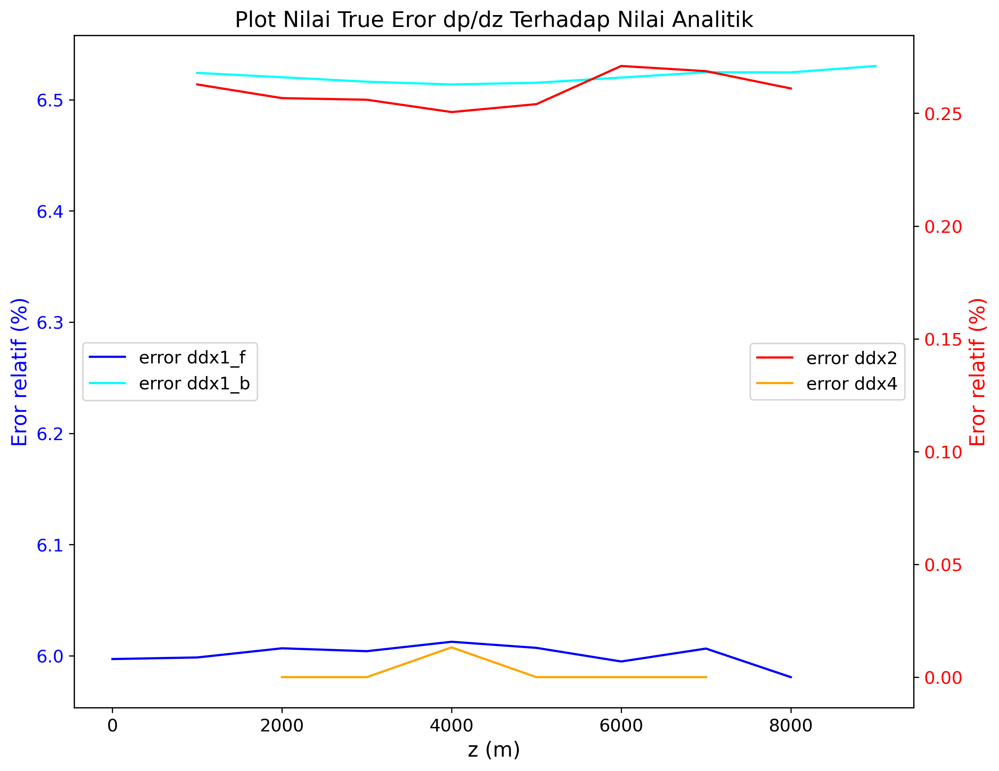

In [120]:
fig2 = plt.figure(figsize=(10,8), dpi = 300)
ax2 = fig2.add_axes([0.1, 0.1, 0.8, 0.8]) # Blue group
ax21 = ax2.twinx() # Red group

# X axis
ax2.set_xlabel('z (m)', fontsize=14)
ax2.tick_params(axis='x', labelsize=12)

# Blue group
ax2.plot(z, true1_f, color = "blue", label = "error ddx1_f")
ax2.plot(z, true1_b, color = "cyan", label = "error ddx1_b")

ax2.set_ylabel('Eror relatif (%)', fontsize=14, color="blue")
ax2.tick_params(axis='y', labelsize=12, labelcolor = "blue")

# Red group
ax21.plot(z, true2, color = "red", label = "error ddx2")
ax21.plot(z, true4, color = "orange", label = "error ddx4")

ax21.set_ylabel('Eror relatif (%)', fontsize=14, color = "red")
ax21.tick_params(axis='y', labelsize=12, labelcolor = "red")

# Legends
ax2.legend(loc=6, fontsize = 12) # Blue group
ax21.legend(loc=7, fontsize = 12) # Red group

ax2.set_title('Plot Nilai True Eror dp/dz Terhadap Nilai Analitik', fontsize=15)
fig2.savefig("output/no41b_err.png", dpi=300)

# 4.2

In [3]:
# 4.2a
advec = np.loadtxt("advection/ftbs.dat")
advec = pd.DataFrame(advec)
advec.columns = ["x", "t", "u"]
x = advec["x"]
t = advec["t"]
u = advec["u"]

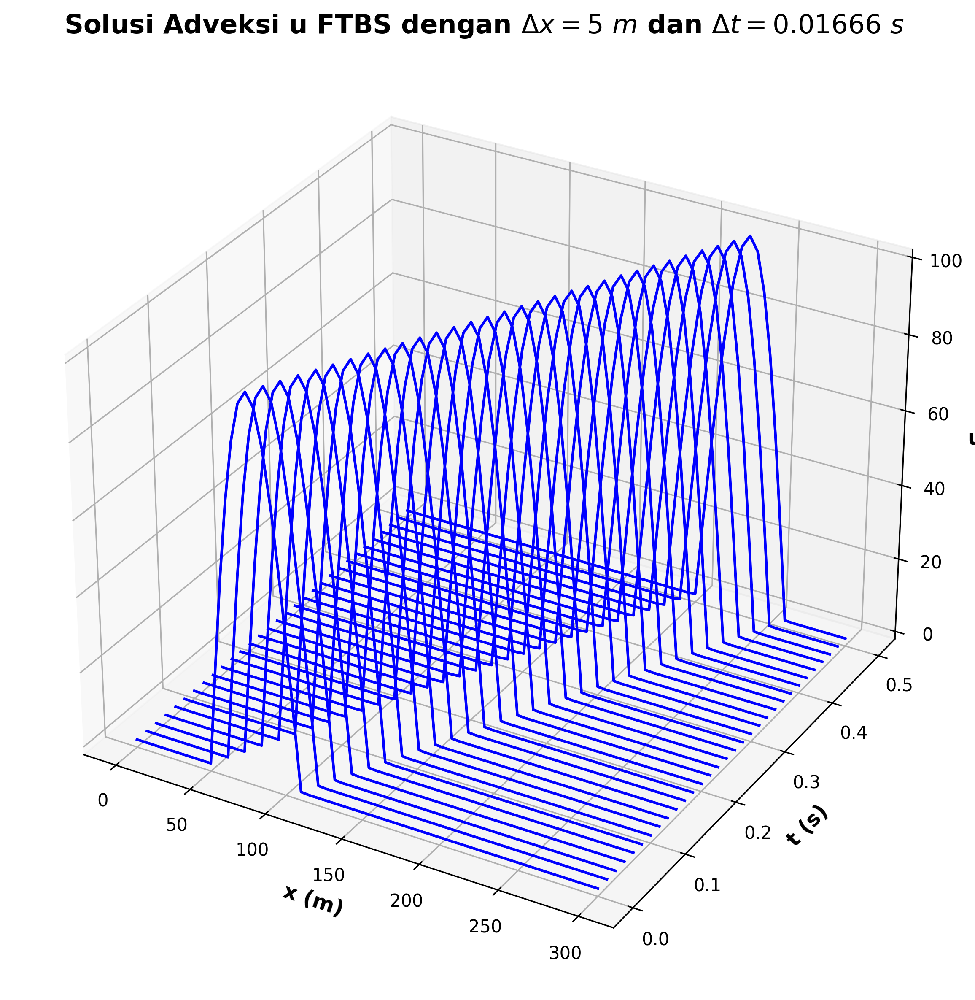

In [235]:
fig3 = plt.figure(figsize=(8, 8), dpi=300)
ax3 = fig3.add_subplot(1,1,1, projection = "3d")

for i in range(len(advec)):
    if i%61 == 0:
        ax3.plot3D(x[i:i+61], t[i:i+61], u[i:i+61], "blue")
ax3.set_title(r'Solusi Adveksi u FTBS dengan $\Delta x = 5\ m$ dan $\Delta t = 0.01666\ s$', fontsize=15, fontweight ='bold')
ax3.set_xlabel('x (m)', fontsize=12, fontweight ='bold')
ax3.set_ylabel('t (s)', fontsize=12, fontweight ='bold')
ax3.set_zlabel('u', fontsize=12, fontweight ='bold')
plt.tight_layout()
fig3.savefig("output/no42a.png", dpi=300)

In [236]:
# 4.2b
# \Delta t = 0.01666
advecb1 = np.loadtxt("advection/ftbs.dat")
advecb1 = pd.DataFrame(advecb1)
advecb1.columns = ["x", "t", "u"]
xb1 = advecb1["x"]
tb1 = advecb1["t"]
ub1 = advecb1["u"]

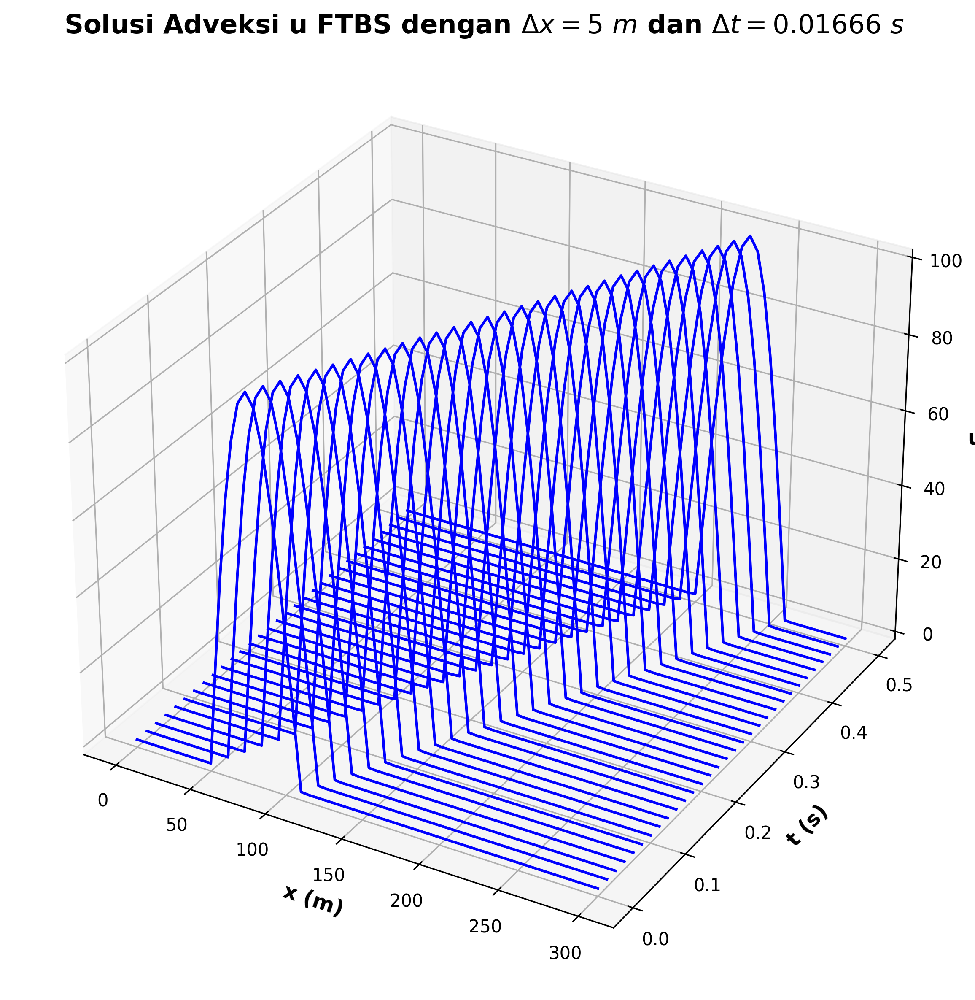

In [237]:
fig3 = plt.figure(figsize=(8, 8), dpi=300)
ax3 = fig3.add_subplot(1,1,1, projection = "3d")

for i in range(len(advecb1)):
    if i%61 == 0:
        ax3.plot3D(xb1[i:i+61], tb1[i:i+61], ub1[i:i+61], "blue")
ax3.set_title(r'Solusi Adveksi u FTBS dengan $\Delta x = 5\ m$ dan $\Delta t = 0.01666\ s$', fontsize=15, fontweight ='bold')
ax3.set_xlabel('x (m)', fontsize=12, fontweight ='bold')
ax3.set_ylabel('t (s)', fontsize=12, fontweight ='bold')
ax3.set_zlabel('u', fontsize=12, fontweight ='bold')
plt.tight_layout()
fig3.savefig("output/no42b1.png", dpi=300)

In [238]:
# 4.2b
# \Delta t = 0.0075
advecb2 = np.loadtxt("advection/ftbsb.dat")
advecb2 = pd.DataFrame(advecb2)
advecb2.columns = ["x", "t", "u"]
xb2 = advecb2["x"]
tb2 = advecb2["t"]
ub2 = advecb2["u"]

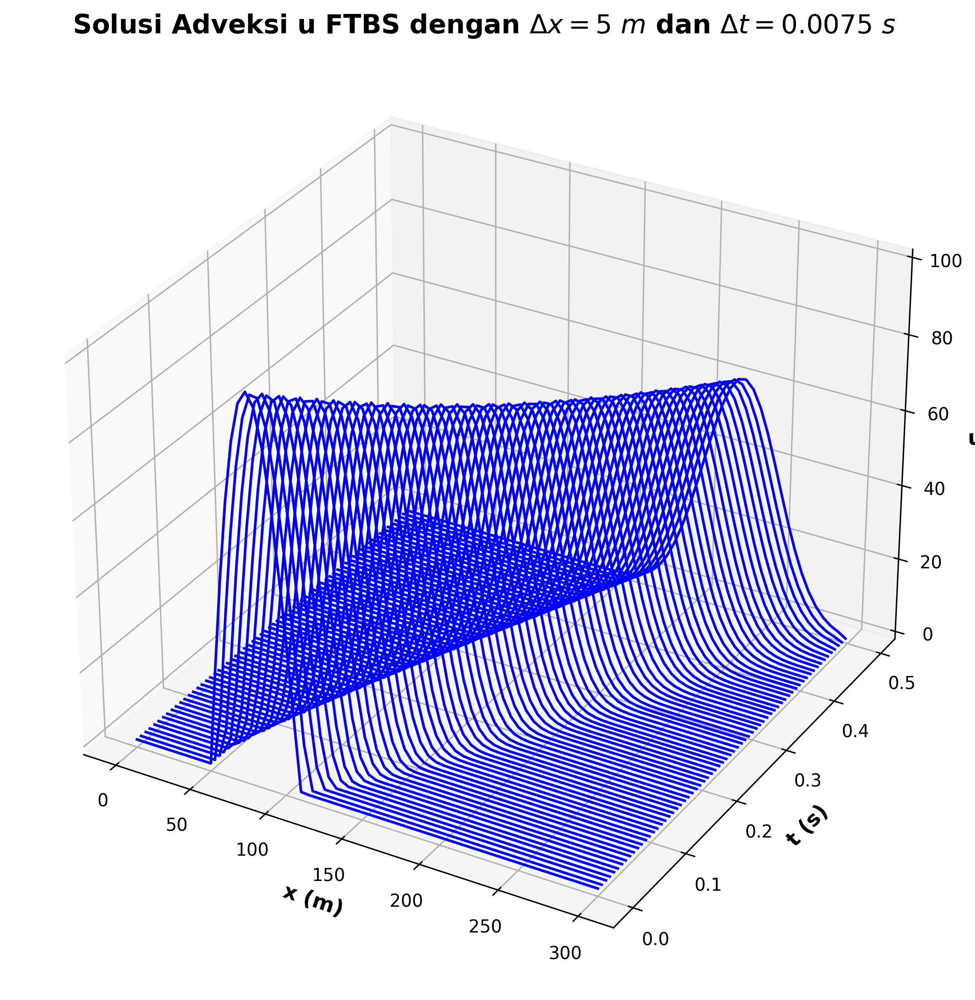

In [239]:
fig3 = plt.figure(figsize=(8, 8), dpi=300)
ax3 = fig3.add_subplot(1,1,1, projection = "3d")

for i in range(len(advecb2)):
    if i%61 == 0:
        ax3.plot3D(xb2[i:i+61], tb2[i:i+61], ub2[i:i+61], "blue")
ax3.set_title(r'Solusi Adveksi u FTBS dengan $\Delta x = 5\ m$ dan $\Delta t = 0.0075\ s$', fontsize=15, fontweight ='bold')
ax3.set_xlabel('x (m)', fontsize=12, fontweight ='bold')
ax3.set_ylabel('t (s)', fontsize=12, fontweight ='bold')
ax3.set_zlabel('u', fontsize=12, fontweight ='bold')
plt.tight_layout()
fig3.savefig("output/no42b2.png", dpi=300)

In [123]:
# 4.2b
# \Delta t = 0.02
advecb3 = np.loadtxt("advection/ftbsb2.dat")
advecb3 = pd.DataFrame(advecb3)
advecb3.columns = ["x", "t", "u"]
xb3 = advecb3["x"]
tb3 = advecb3["t"]
ub3 = advecb3["u"]

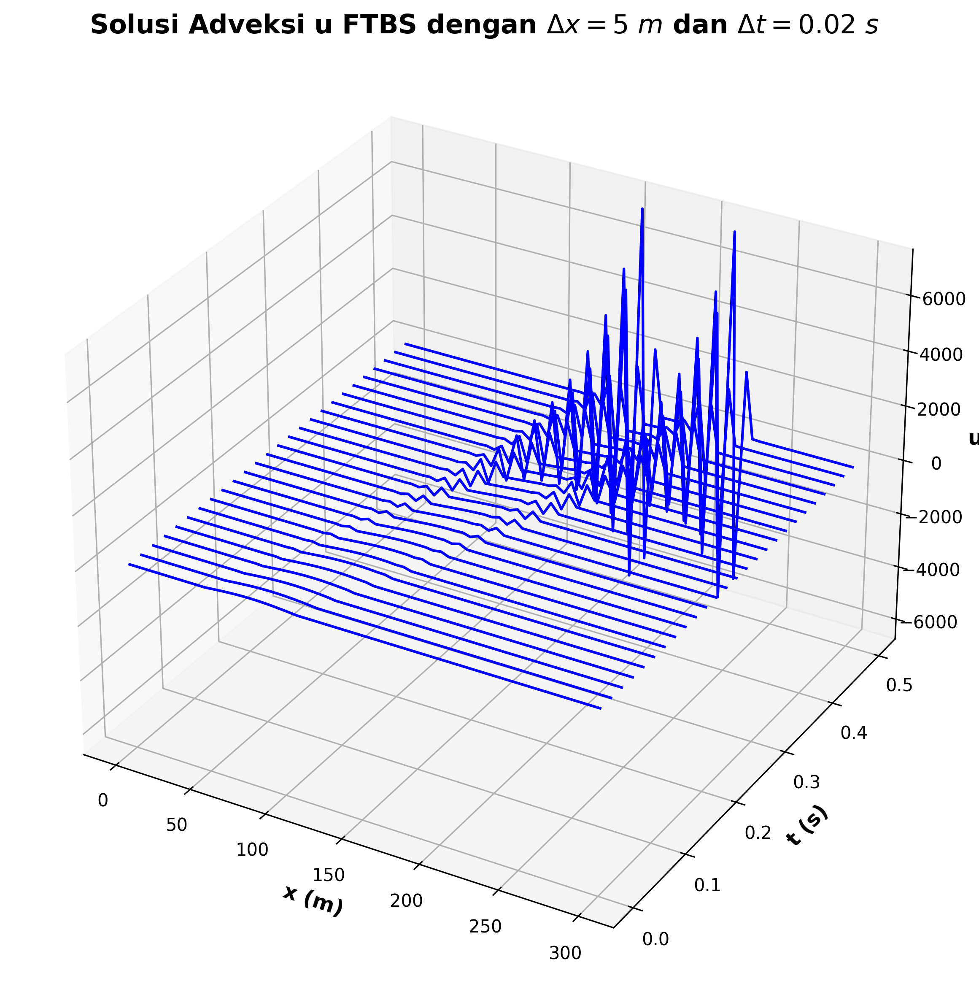

In [126]:
fig3 = plt.figure(figsize=(9, 8), dpi=300)
ax3 = fig3.add_subplot(1,1,1, projection = "3d")

for i in range(len(advecb3)):
    if i%61 == 0:
        ax3.plot3D(xb3[i:i+61], tb3[i:i+61], ub3[i:i+61], "blue")
ax3.set_title(r'Solusi Adveksi u FTBS dengan $\Delta x = 5\ m$ dan $\Delta t = 0.02\ s$', fontsize=15, fontweight ='bold')
ax3.set_xlabel('x (m)', fontsize=12, fontweight ='bold')
ax3.set_ylabel('t (s)', fontsize=12, fontweight ='bold')
ax3.set_zlabel('u', fontsize=12, fontweight ='bold')
plt.tight_layout()
fig3.savefig("output/no42b3.png", dpi=300)

In [4]:
# 4.2c
# FTFS
advecf = np.loadtxt("advection/ftfs.dat")
advecf = pd.DataFrame(advecf)
advecf.columns = ["x", "t", "u"]
xf = advecf["x"]
tf = advecf["t"]
uf = advecf["u"]

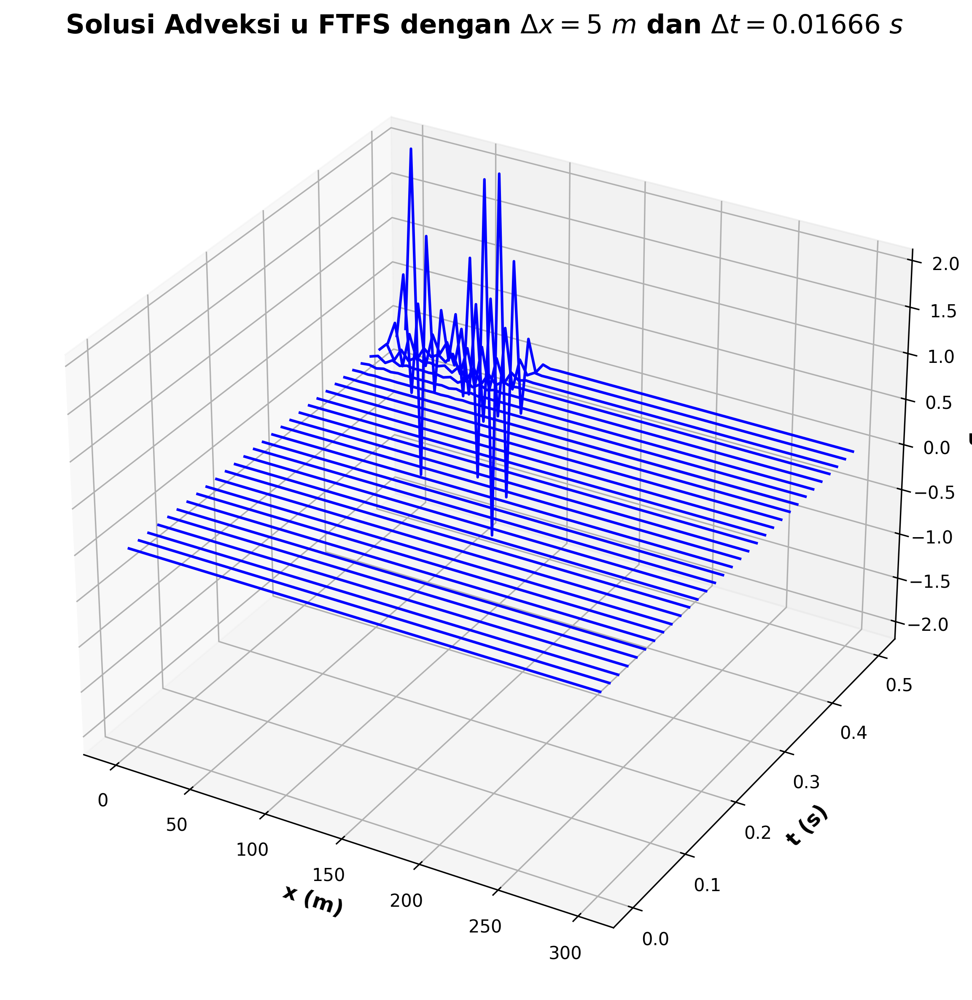

In [5]:
fig3 = plt.figure(figsize=(9, 8), dpi=300)
ax3 = fig3.add_subplot(1,1,1, projection = "3d")

for i in range(len(advecf)):
    if i%61 == 0:
        ax3.plot3D(xf[i:i+61], tf[i:i+61], uf[i:i+61], "blue")
ax3.set_title(r'Solusi Adveksi u FTFS dengan $\Delta x = 5\ m$ dan $\Delta t = 0.01666\ s$', fontsize=15, fontweight ='bold')
ax3.set_xlabel('x (m)', fontsize=12, fontweight ='bold')
ax3.set_ylabel('t (s)', fontsize=12, fontweight ='bold')
ax3.set_zlabel('u', fontsize=12, fontweight ='bold')
plt.tight_layout()
fig3.savefig("output/no42c.png", dpi=300)

In [12]:
# 4.2c
# FTFS, a = -300 m/s
advecf3 = np.loadtxt("advection/ftfs3.dat")
advecf3 = pd.DataFrame(advecf3)
advecf3.columns = ["x", "t", "u"]
xf3 = advecf3["x"]
tf3 = advecf3["t"]
uf3 = advecf3["u"]

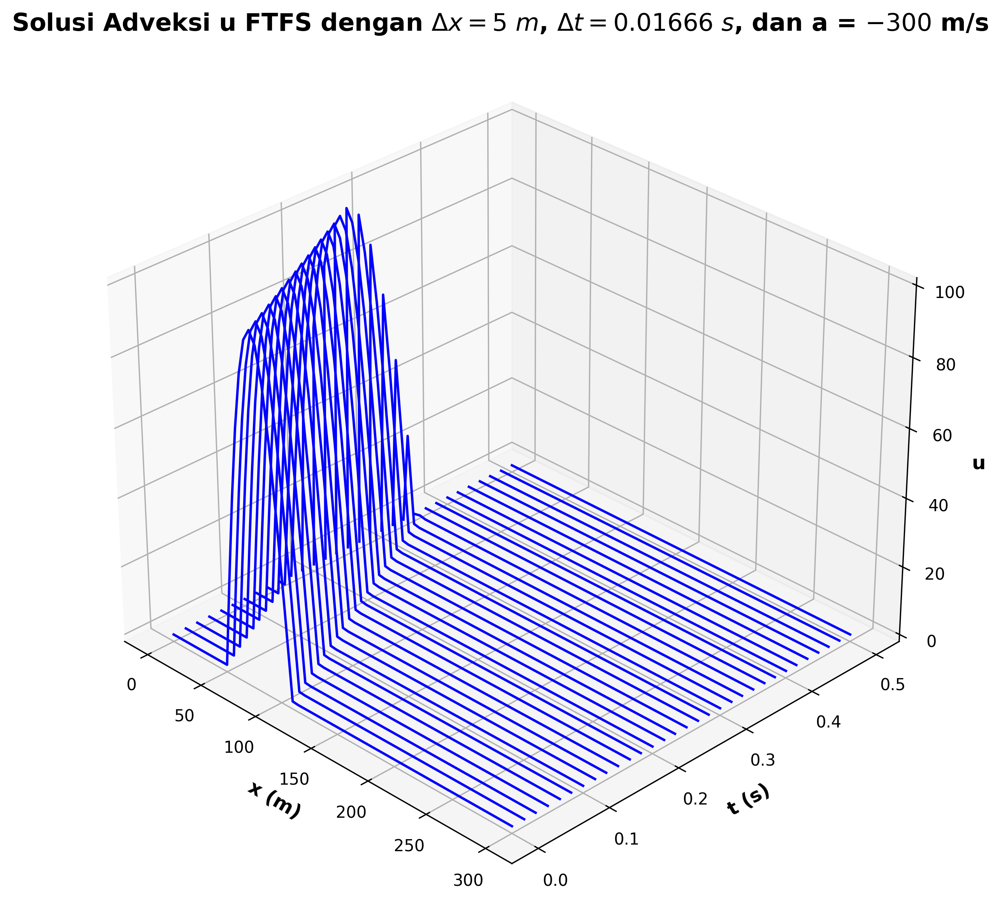

In [13]:
fig3 = plt.figure(figsize=(10, 8), dpi=300)
ax3 = fig3.add_subplot(1,1,1, projection = "3d")

for i in range(len(advecf3)):
    if i%61 == 0:
        ax3.plot3D(xf3[i:i+61], tf3[i:i+61], uf3[i:i+61], "blue")
ax3.set_title(r'Solusi Adveksi u FTFS dengan $\Delta x = 5\ m$, $\Delta t = 0.01666\ s$, dan a = $-300$ m/s', fontsize=15, fontweight ='bold')
ax3.set_xlabel('x (m)', fontsize=12, fontweight ='bold')
ax3.set_ylabel('t (s)', fontsize=12, fontweight ='bold')
ax3.set_zlabel('u', fontsize=12, fontweight ='bold')
plt.tight_layout()
ax3.view_init(30, -45)
fig3.savefig("output/no42c3.png", dpi=300)

In [20]:
# 4.2d
# FTCS
advecc = np.loadtxt("advection/ftcs.dat")
advecc = pd.DataFrame(advecc)
advecc.columns = ["x", "t", "u"]
xc = advecc["x"]
tc = advecc["t"]
uc = advecc["u"]

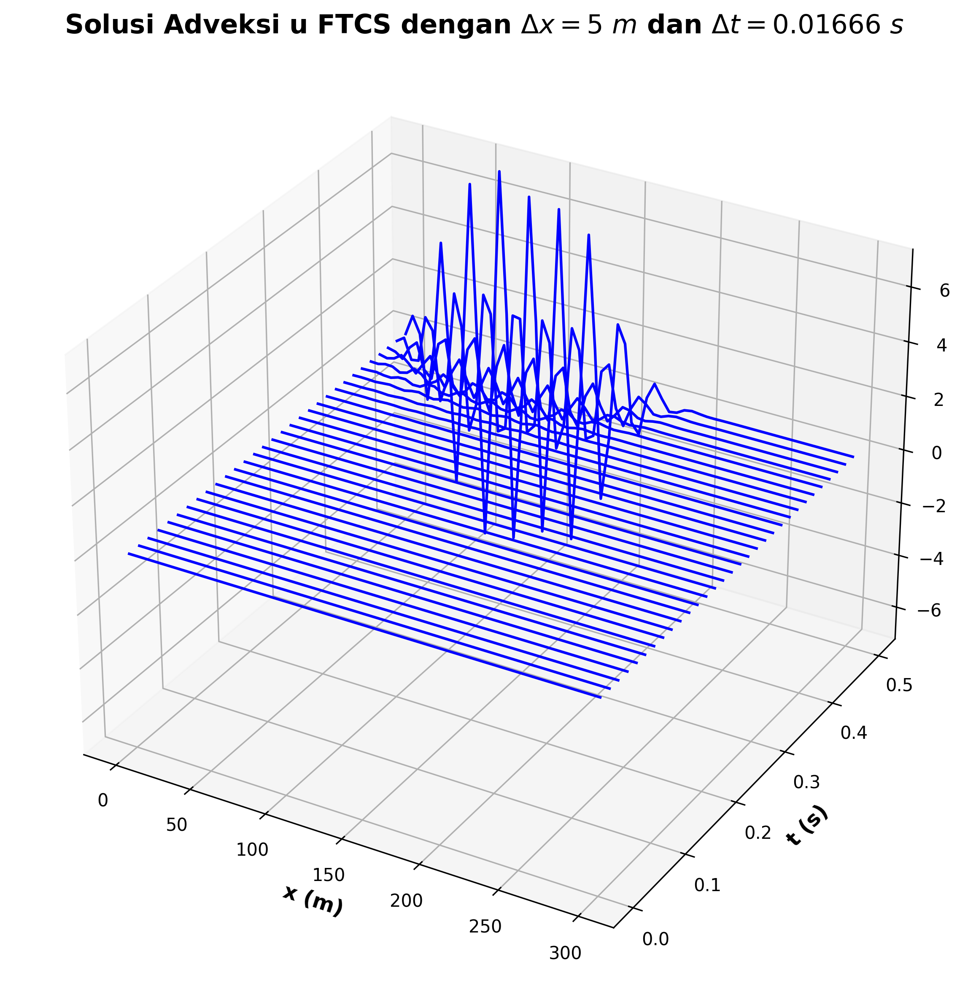

In [21]:
fig3 = plt.figure(figsize=(9, 8), dpi=300)
ax3 = fig3.add_subplot(1,1,1, projection = "3d")

for i in range(len(advecc)):
    if i%61 == 0:
        ax3.plot3D(xc[i:i+61], tc[i:i+61], uc[i:i+61], "blue")
ax3.set_title(r'Solusi Adveksi u FTCS dengan $\Delta x = 5\ m$ dan $\Delta t = 0.01666\ s$', fontsize=15, fontweight ='bold')
ax3.set_xlabel('x (m)', fontsize=12, fontweight ='bold')
ax3.set_ylabel('t (s)', fontsize=12, fontweight ='bold')
ax3.set_zlabel('u', fontsize=12, fontweight ='bold')
plt.tight_layout()
fig3.savefig("output/no42d_FTCS.png", dpi=300)

In [248]:
# 4.2d
# FTCS, a = -300 m/s
advecc3 = np.loadtxt("advection/ftcs3.dat")
advecc3 = pd.DataFrame(advecc3)
advecc3.columns = ["x", "t", "u"]
xc3 = advecc3["x"]
tc3 = advecc3["t"]
uc3 = advecc3["u"]

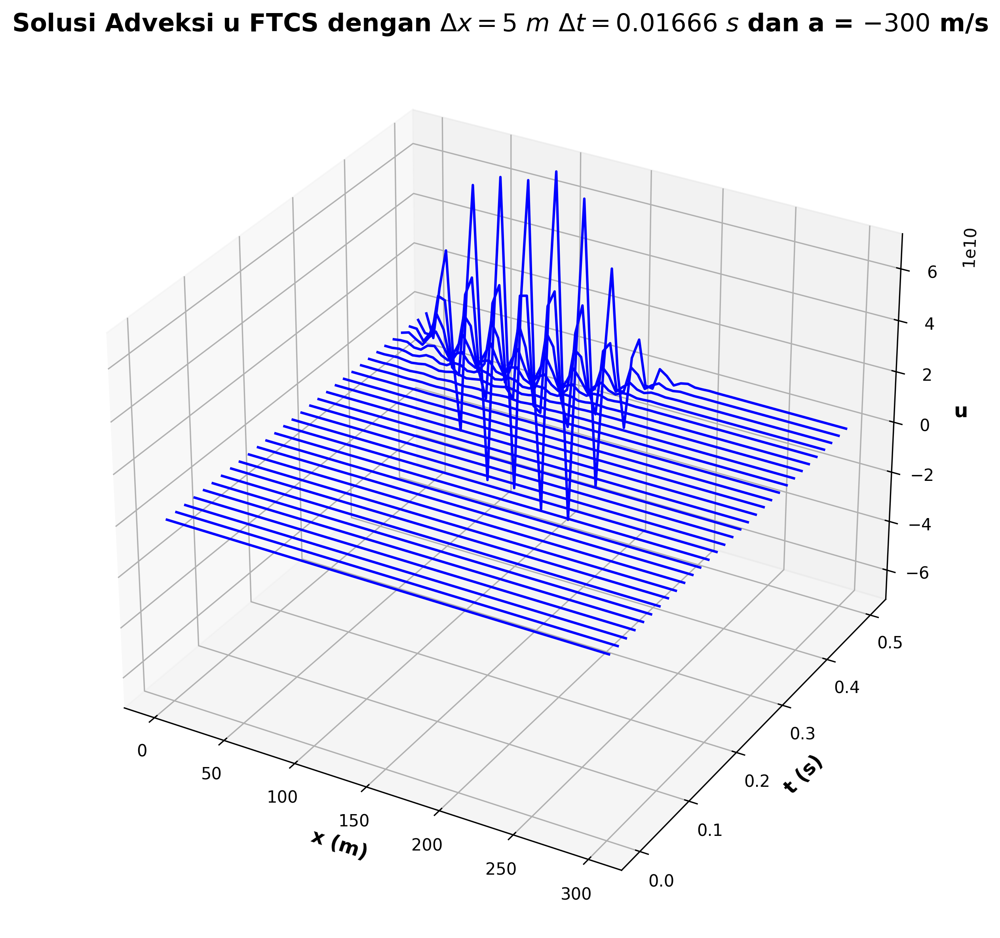

In [249]:
fig3 = plt.figure(figsize=(10, 8), dpi=300)
ax3 = fig3.add_subplot(1,1,1, projection = "3d")

for i in range(len(advecc3)):
    if i%61 == 0:
        ax3.plot3D(xc3[i:i+61], tc3[i:i+61], uc3[i:i+61], "blue")
ax3.set_title(r'Solusi Adveksi u FTCS dengan $\Delta x = 5\ m$ $\Delta t = 0.01666\ s$ dan a = $-300$ m/s', fontsize=15, fontweight ='bold')
ax3.set_xlabel('x (m)', fontsize=12, fontweight ='bold')
ax3.set_ylabel('t (s)', fontsize=12, fontweight ='bold')
ax3.set_zlabel('u', fontsize=12, fontweight ='bold')
plt.tight_layout()
fig3.savefig("output/no42d_FTCS3.png", dpi=300)

In [250]:
# 4.2d
# CTCS
advecct = np.loadtxt("advection/ctcs.dat")
advecct = pd.DataFrame(advecct)
advecct.columns = ["x", "t", "u"]
xct = advecct["x"]
tct = advecct["t"]
uct = advecct["u"]

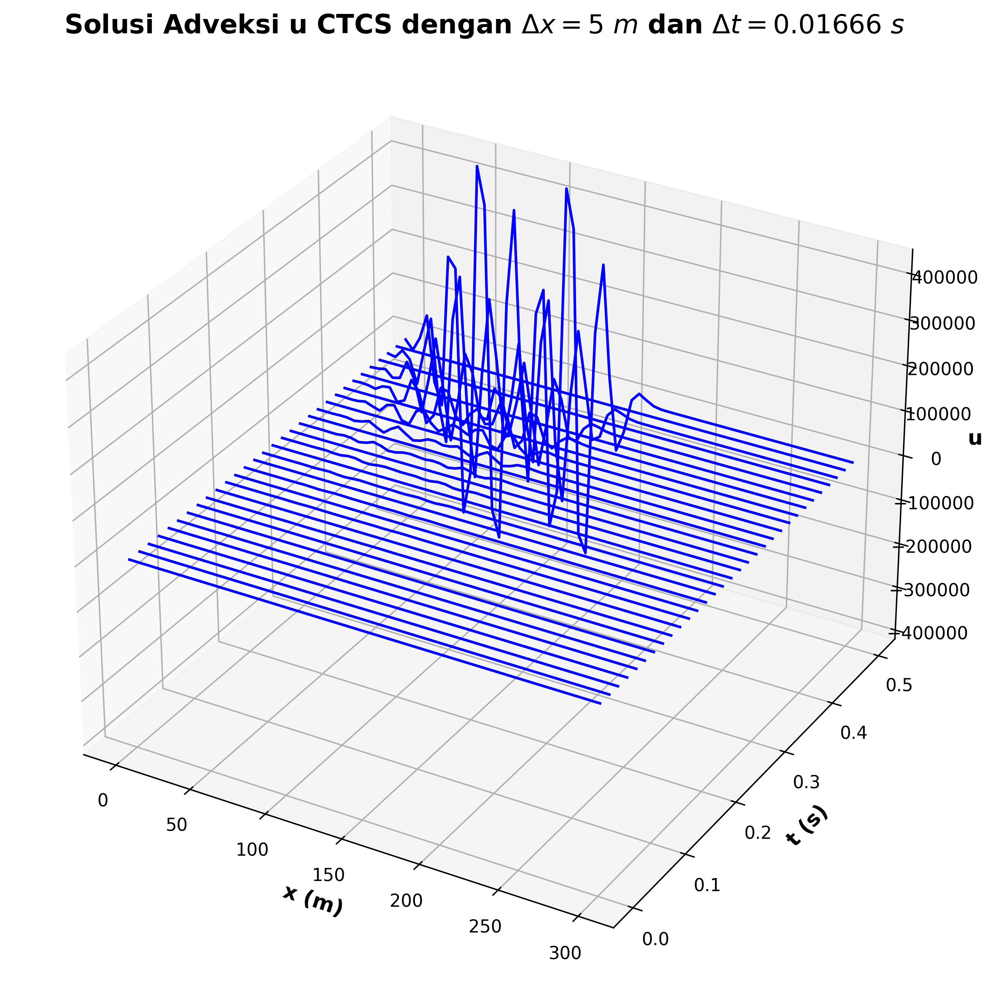

In [251]:
fig3 = plt.figure(figsize=(10, 8), dpi=300)
ax3 = fig3.add_subplot(1,1,1, projection = "3d")

for i in range(len(advecct)):
    if i%61 == 0:
        ax3.plot3D(xct[i:i+61], tct[i:i+61], uct[i:i+61], "blue")
ax3.set_title(r'Solusi Adveksi u CTCS dengan $\Delta x = 5\ m$ dan $\Delta t = 0.01666\ s$', fontsize=15, fontweight ='bold')
ax3.set_xlabel('x (m)', fontsize=12, fontweight ='bold')
ax3.set_ylabel('t (s)', fontsize=12, fontweight ='bold')
ax3.set_zlabel('u', fontsize=12, fontweight ='bold')
plt.tight_layout()
fig3.savefig("output/no42d_CTCS.png", dpi=300)

In [252]:
# 4.2d
# CTCS, a = -300 m/s
advecct3 = np.loadtxt("advection/ctcs3.dat")
advecct3 = pd.DataFrame(advecct3)
advecct3.columns = ["x", "t", "u"]
xct3 = advecct3["x"]
tct3 = advecct3["t"]
uct3 = advecct3["u"]

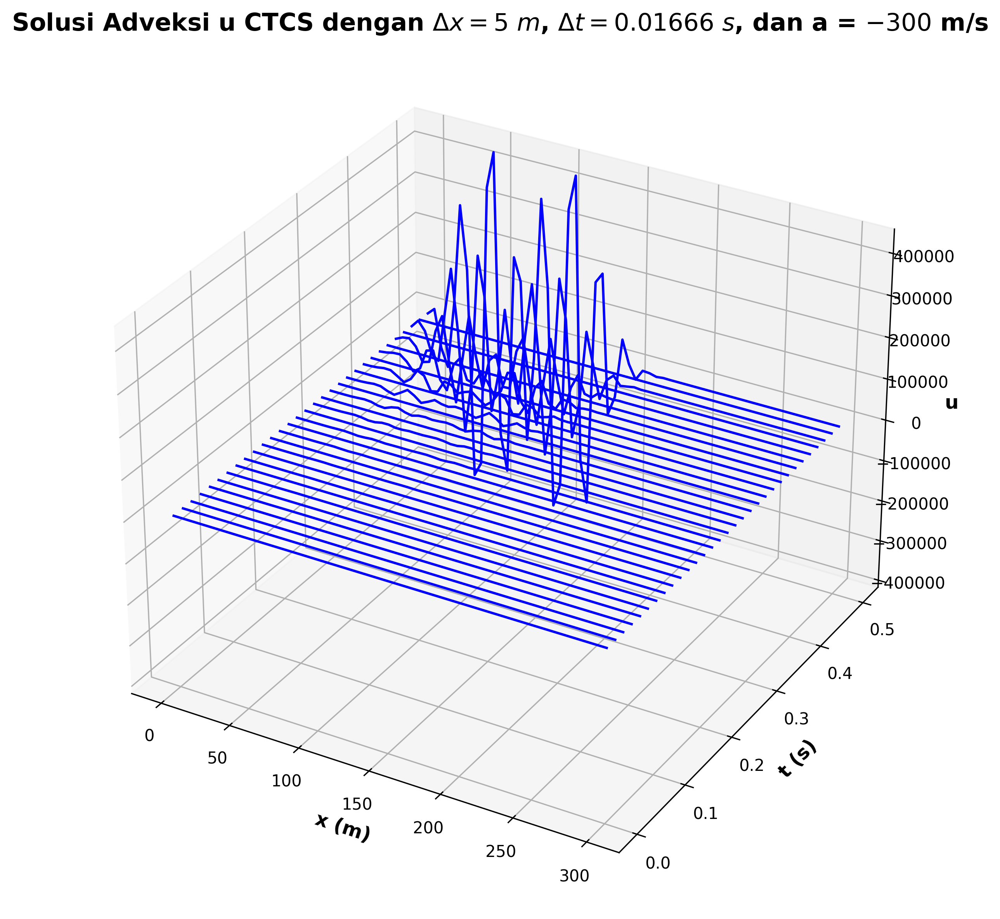

In [253]:
fig3 = plt.figure(figsize=(10, 8), dpi=300)
ax3 = fig3.add_subplot(1,1,1, projection = "3d")

for i in range(len(advecct3)):
    if i%61 == 0:
        ax3.plot3D(xct3[i:i+61], tct3[i:i+61], uct3[i:i+61], "blue")
ax3.set_title(r'Solusi Adveksi u CTCS dengan $\Delta x = 5\ m$, $\Delta t = 0.01666\ s$, dan a = $-300$ m/s', fontsize=15, fontweight ='bold')
ax3.set_xlabel('x (m)', fontsize=12, fontweight ='bold')
ax3.set_ylabel('t (s)', fontsize=12, fontweight ='bold')
ax3.set_zlabel('u', fontsize=12, fontweight ='bold')
plt.tight_layout()
fig3.savefig("output/no42d_CTCS3.png", dpi=300)

# 4.3

In [ ]:
# 4.3
# FTBS, a = 300 m/s
model3 = np.loadtxt("model/hasil.dat")
model3 = pd.DataFrame(model3)
model3.columns = ["x", "t", "u"]
xm3 = model3["x"]
tm3 = model3["t"]
um3 = model3["u"]

fig3 = plt.figure(figsize=(9, 8), dpi=300)
ax3 = fig3.add_subplot(1,1,1, projection = "3d")

for i in range(len(model3)):
    if i%73 == 0:
        ax3.plot3D(xm3[i:i+73], tm3[i:i+73], um3[i:i+73], "blue")
ax3.set_title(r'Solusi u FTBS dengan $\Delta x = 539459.81\ m$ dan $\Delta t = 1798\ s$', 
              fontsize=15, fontweight ='bold')
ax3.set_xlabel('x (m)', fontsize=12, fontweight ='bold')
ax3.set_ylabel('t (s)', fontsize=12, fontweight ='bold')
ax3.set_zlabel('u', fontsize=12, fontweight ='bold')
plt.tight_layout()
fig3.savefig("output/no43_FTBS3.png", dpi=300)

In [127]:
# 4.3
# FTBS, a = 300 m/s
model3 = np.loadtxt("model/hasil.dat")
model3 = pd.DataFrame(model3)
model3.columns = ["x", "t", "u"]
xm3 = model3["x"]
tm3 = model3["t"]
um3 = model3["u"]

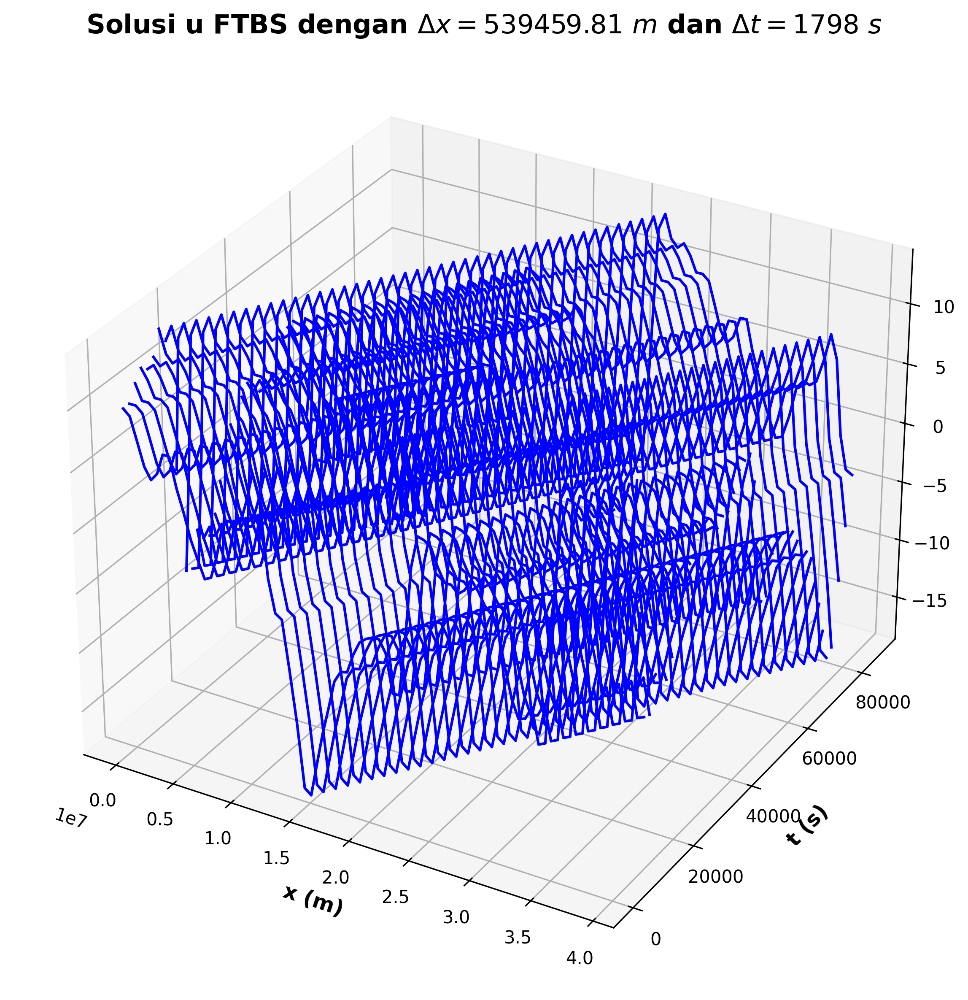

In [128]:
fig3 = plt.figure(figsize=(9, 8), dpi=300)
ax3 = fig3.add_subplot(1,1,1, projection = "3d")

for i in range(len(model3)):
    if i%73 == 0:
        ax3.plot3D(xm3[i:i+73], tm3[i:i+73], um3[i:i+73], "blue")
ax3.set_title(r'Solusi u FTBS dengan $\Delta x = 539459.81\ m$ dan $\Delta t = 1798\ s$', fontsize=15, fontweight ='bold')
ax3.set_xlabel('x (m)', fontsize=12, fontweight ='bold')
ax3.set_ylabel('t (s)', fontsize=12, fontweight ='bold')
ax3.set_zlabel('u', fontsize=12, fontweight ='bold')
#ax3.view_init(elev=20, azim=-25)
plt.tight_layout()
fig3.savefig("output/no43_FTBS3.png", dpi=300)

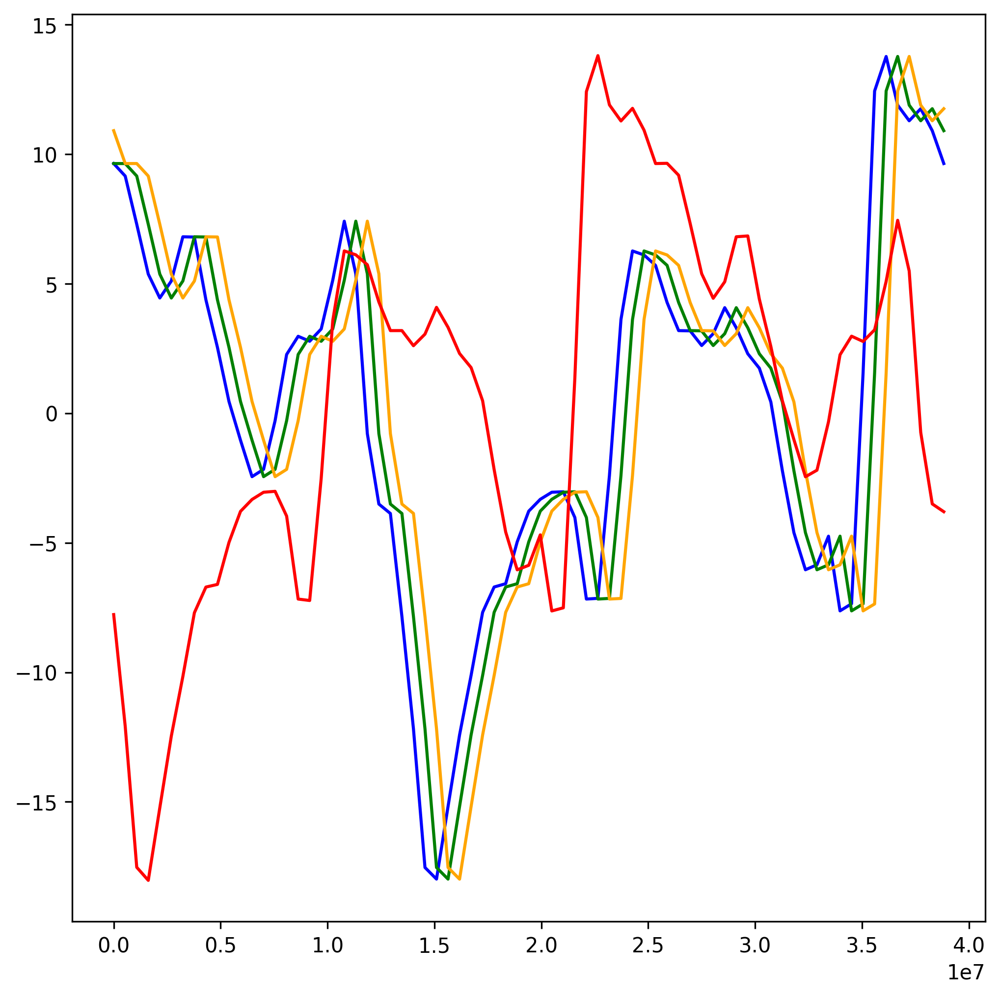

In [266]:
fig3 = plt.figure(figsize=(8, 8), dpi=300)
ax3 = fig3.add_subplot(1,1,1)

#for i in range(len(model3)):
 #   if i%73 == 0:
        #ax3.plot(xm3[i:i+73], um3[i:i+73], "blue")
ax3.plot(xm3[0:73], um3[0:73], "blue")
ax3.plot(xm3[73:73*2], um3[73:73*2], "green")
ax3.plot(xm3[73*2:73*3], um3[73*2:73*3], "orange")
ax3.plot(xm3[3577-73:3577], um3[3577-73:3577], "red")

In [257]:
# Import Data
# a. FTFS
# Membaca file .dat
data = np.loadtxt('drive/MyDrive/metnum/1_10/hasil_ftfs25.dat')
data = pd.DataFrame(data)
data.columns = ['t (s)', 'x (m)', 'T (°C)']

xf = data["x (m)"].values   # Sumbu x
yf = data["t (s)"].values   # Sumbu y
zf = data["T (°C)"].values  # Sumbu z

#==============================================================================

# b. FTBS
# Membaca file .dat
data = np.loadtxt('drive/MyDrive/metnum/1_10/hasil_ftbs25.dat')
data = pd.DataFrame(data)
data.columns = ['t (s)', 'x (m)', 'T (°C)']

xb = data["x (m)"].values   # Sumbu x
yb = data["t (s)"].values   # Sumbu y
zb = data["T (°C)"].values  # Sumbu z

#==============================================================================

# c. FTCS
# Membaca file .dat
data = np.loadtxt('drive/MyDrive/metnum/1_10/hasil_ftcs25.dat')
data = pd.DataFrame(data)
data.columns = ['t (s)', 'x (m)', 'T (°C)']

xc = data["x (m)"].values   # Sumbu x
yc = data["t (s)"].values   # Sumbu y
zc = data["T (°C)"].values  # Sumbu z

#==============================================================================

# Plot Grafik
fig = plt.figure(figsize=(25,8))

# Plot FTFS
axf = fig.add_subplot(1, 3, 1, projection='3d')
axf.plot3D(xf,yf,zf, "red")
axf.set_title('Adveksi Eksplisit: FTFS, a = 10 m/s', fontsize=15, 
              fontweight ='bold')
axf.set_xlabel('x (m)', fontsize=10, fontweight ='bold')
axf.set_ylabel('t (s)', fontsize=10, fontweight ='bold')
axf.set_zlabel('T (°C)', fontsize=10, fontweight ='bold')

# Plot FTBS
axb = fig.add_subplot(1, 3, 2, projection='3d')
axb.plot3D(xb,yb,zb, "blue")
axb.set_title('Adveksi Eksplisit: FTBS, a = 10 m/s', fontsize=15, 
              fontweight ='bold')
axb.set_xlabel('x (m)', fontsize=10, fontweight ='bold')
axb.set_ylabel('t (s)', fontsize=10, fontweight ='bold')
axb.set_zlabel('T (°C)', fontsize=10, fontweight ='bold')

# Plot FTCS
axc = fig.add_subplot(1, 3, 3, projection='3d')
axc.plot3D(xc,yc,zc, "green")
axc.set_title('Adveksi Eksplisit: FTCS, a = 10 m/s', fontsize=15, 
              fontweight ='bold')
axc.set_xlabel('x (m)', fontsize=10, fontweight ='bold')
axc.set_ylabel('t (s)', fontsize=10, fontweight ='bold')
axc.set_zlabel('T (°C)', fontsize=10, fontweight ='bold')

plt.tight_layout()


FileNotFoundError: drive/MyDrive/metnum/1_10/hasil_ftfs25.dat not found.